## Edge detection
영상(images)에서의 edge = 픽셀값이 급격히 변하는 지점 = 1차 미분값이 최대인 지점

**OpenCV** 라이브러리를 이용하여 필터링을 직접 진행.

opencv의 `filter2D`
* opencv docs에서 filter2D를 확인해보면 파라미터 구성이 이렇습니다.
`cv::filter2D(inputArray src, OutputArray dst, int ddepth, InputArray kernel, Point anchor=Point(-1,-1), int iterations=1, int borderType=BORDER_CONSTANT, const Scalar &borderValue=morphologyDefaultBorderValue())`
* opencv-python에서는 훨씬 더 간단합니다.
`cv.filter2D(img, -1, kernel)`

### OpenCV를 이용하여 필터 성능 비교
* 기본 미분 필터 : 미분 연산을 통해 픽셀값이 급격하게 변하는 지점을 찾는다.

In [17]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [34]:
img = cv2.imread("./Study/assets/Lena.png")
img_view = Image.open("./Study/assets/Lena.png")

Text(0.5, 1.0, 'Original image')

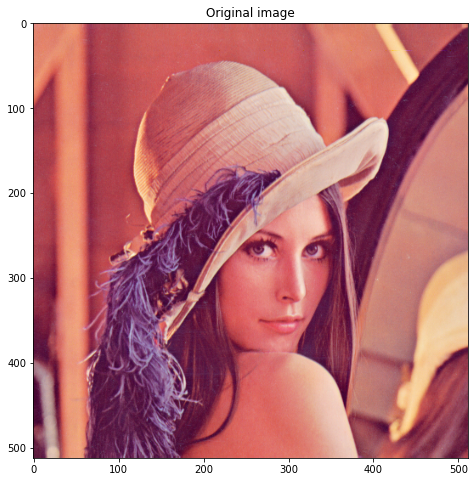

In [36]:
fig = plt.figure(figsize=(15,8))
image = fig.add_subplot(1,1,1)
image.imshow(img_view)
image.set_title("Original image")

In [37]:
# 기본 미분 filter
G_x = np.array([[-1,1]])
G_y = np.array([[-1],[1]])

In [38]:
# 필터 적용
edge_x = cv2.filter2D(img, -1, G_x)
edge_y = cv2.filter2D(img, -1, G_y)

In [31]:
# opencv를 이용하여 이미지 보기
while 1:

    cv2.imshow('Vertical Edge', edge_x)
    cv2.imshow('Horizontal Edge', edge_y)
    
    key = cv2.waitKey() & 0xFF
    if key == 27:
        break

cv2.waitKey()
cv2.destroyAllWindows()

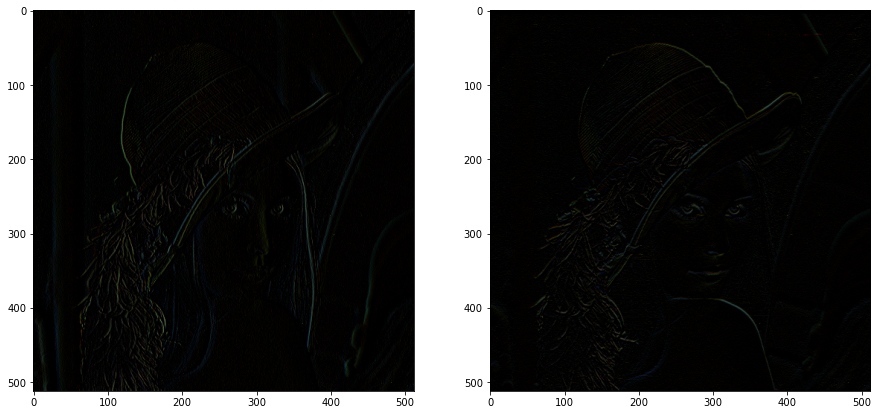

In [41]:
# plt를 이용하여 이미지 보기
fig = plt.figure(figsize=(15,8))
vertical = fig.add_subplot(1,2,1)
vertical.imshow(edge_x)

horizontal = fig.add_subplot(1,2,2)
horizontal.imshow(edge_y)

미분 연산을 통해 픽셀값이 급격하게 변하는 곳을 찾아보았습니다. 이처럼 가로방향(horizontal)과 세로방향(vertical) 엣지를 찾고, 이를 합치면 결과적으로 edge detect로서 역할을 할 수 있게 됩니다.

다양한 엣지 검출 필터를 살펴봅시다.
* 기본 미분 필터
    * 미분 연산을 통해 pixel값이 급격하게 변하는 지점을 찾는다.
    * <img src="./Study/assets/edge_1.png" width=80%></img>
* 로버츠 교차 필터
    * 기본 미분 필터에서 대각선 방향으로 1과 -1을 배치해서 사선 경계 검출 효과를 높였다. 실행 속도는 높였지만 edge 강도가 약하다.
    * <img src="./Study/assets/edge_2.png" width=50%></img>
* 프리윗 필터
    * edge 강도를 높여서 방향에 따라 동등한 edge를 찾을 수 있게 하였다. 사선 검출이 약하다.
    * <img src="./Study/assets/edge_3.png" width=50%></img>
* sobel 필터
    * 중심 row의 비중을 높여 robust하게 검출하게 한다. 수평, 수직, 사선 방향 모두 강하게 검출할 수 있다.
    * <img src="./Study/assets/edge_4.png" width=50%></img>
* scharr 필터
    * sobel 필터가 커널의 크기가 크거나 작을 때 중심에서 멀어질수록 edge에 대한 방향성의 정확도가 떨어지는 단점이 있는데, 이를 개선하였다.
    * <img src="./Study/assets/edge_5.png" width=50%></img>
* 라플라시안(Laplacian) 필터
    * 2차 미분 필터이다. 더욱 확실한 경계를 검출할 수 있다.
    * 1차 미분은 edge 검출에, 2차 미분은 영상 개선에 주로 사용된다.
    * <img src="./Study/assets/edge_6.png" width=20%></img>

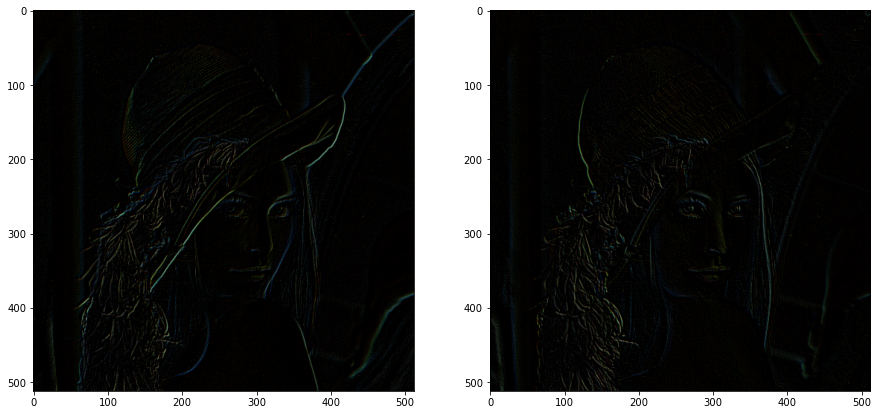

In [42]:
# 로버츠 교차 필터
Roberts_x = np.array([[1,0], [0,-1]])
Roberts_y = np.array([[0,1], [-1,0]])

edge_roberts_x = cv2.filter2D(img, -1, Roberts_x)
edge_roberts_y = cv2.filter2D(img, -1, Roberts_y)

fig = plt.figure(figsize=(15,8))
vertical = fig.add_subplot(1,2,1)
vertical.imshow(edge_roberts_x)

horizontal = fig.add_subplot(1,2,2)
horizontal.imshow(edge_roberts_y)

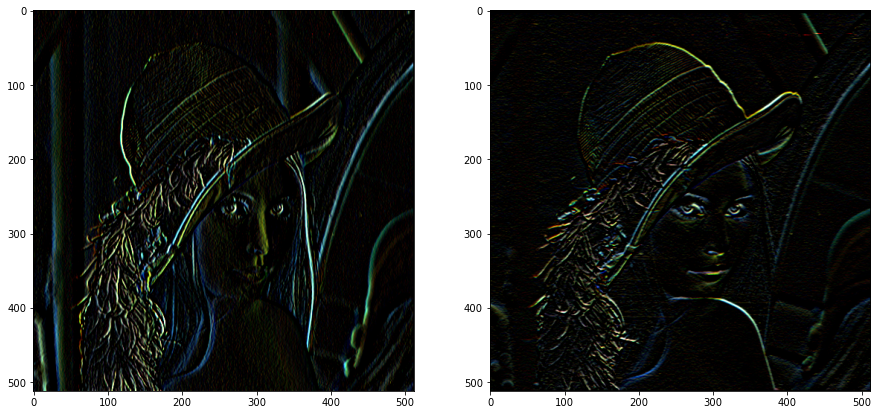

In [43]:
# 프리윗 필터
Prewitt_x = np.array([[-1,0,1], [-1,0,1], [-1,0,1]])
Prewitt_y = np.array([[-1,-1,-1], [0,0,0], [1,1,1]])

edge_Prewitt_x = cv2.filter2D(img, -1, Prewitt_x)
edge_Prewitt_y = cv2.filter2D(img, -1, Prewitt_y)

fig = plt.figure(figsize=(15,8))
vertical = fig.add_subplot(1,2,1)
vertical.imshow(edge_Prewitt_x)

horizontal = fig.add_subplot(1,2,2)
horizontal.imshow(edge_Prewitt_y)

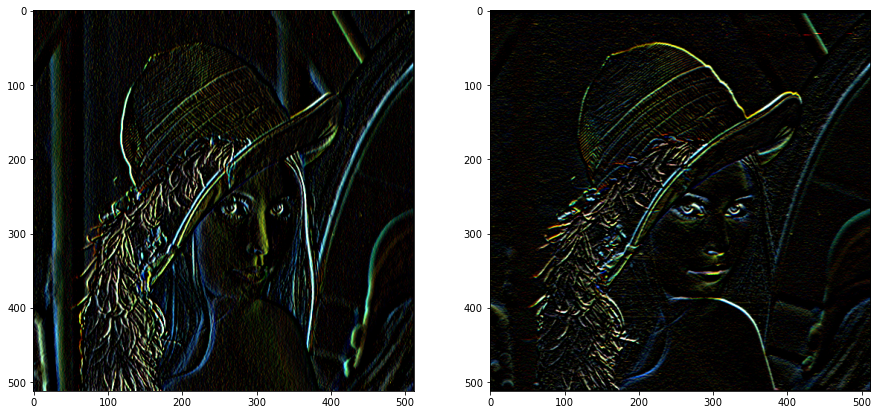

In [44]:
# 소벨 필터
Sobel_x = np.array([[-1,0,1], [-2,0,2], [-1,0,1]])
Sobel_y = np.array([[-1,-2,-1], [0,0,0], [1,2,1]])

edge_Sobel_x = cv2.filter2D(img, -1, Sobel_x)
edge_Sobel_y = cv2.filter2D(img, -1, Sobel_y)

fig = plt.figure(figsize=(15,8))
vertical = fig.add_subplot(1,2,1)
vertical.imshow(edge_Sobel_x)

horizontal = fig.add_subplot(1,2,2)
horizontal.imshow(edge_Sobel_y)

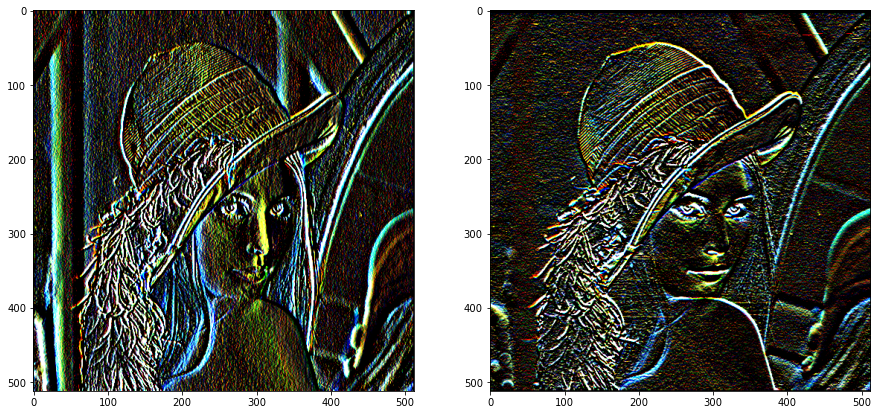

In [45]:
# 샤르 필터
Scharr_x = np.array([[-3,0,3], [-10,0,10], [-3,0,3]])
Scharr_y = np.array([[-3,-10,-3], [0,0,0], [3,10,3]])

edge_Scharr_x = cv2.filter2D(img, -1, Scharr_x)
edge_Scharr_y = cv2.filter2D(img, -1, Scharr_y)

fig = plt.figure(figsize=(15,8))
vertical = fig.add_subplot(1,2,1)
vertical.imshow(edge_Scharr_x)

horizontal = fig.add_subplot(1,2,2)
horizontal.imshow(edge_Scharr_y)

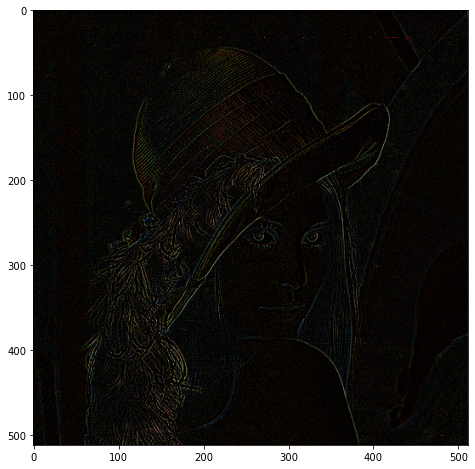

In [48]:
# 라플라시안 필터
Laplacian = np.array([[0,1,0], [1,-4,1], [0,1,0]])

edge_Laplacian = cv2.filter2D(img, -1, Laplacian)

fig = plt.figure(figsize=(15,8))
vertical = fig.add_subplot(1,1,1)
vertical.imshow(edge_Laplacian)

Laplacian을 제외하고 vertical 방향, horizontal 방향으로 나눠서 각각 엣지를 검출하였습니다. vertical edge detector와 horizontal edge detector를 합치면 최종적으로 edge detector로써 작용할 수 있게 됩니다.

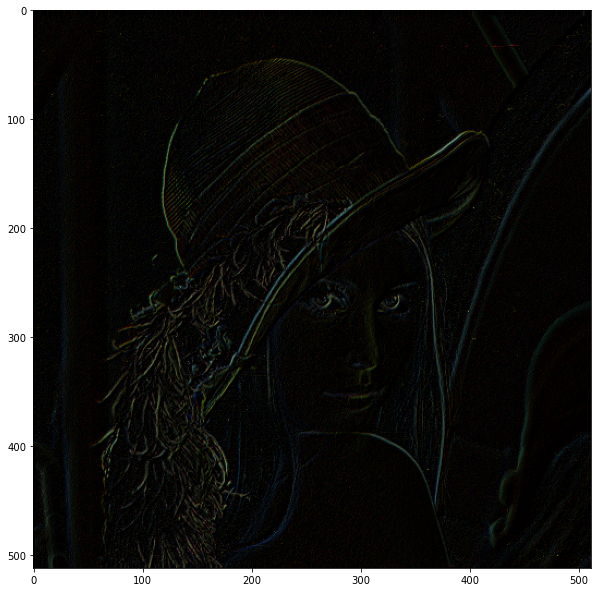

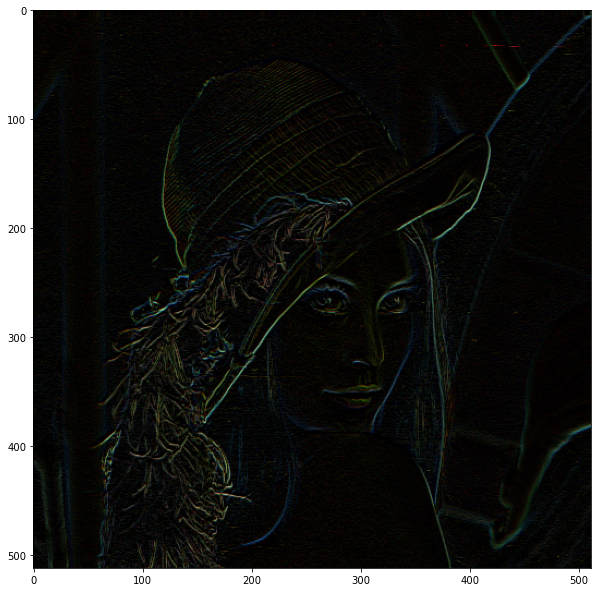

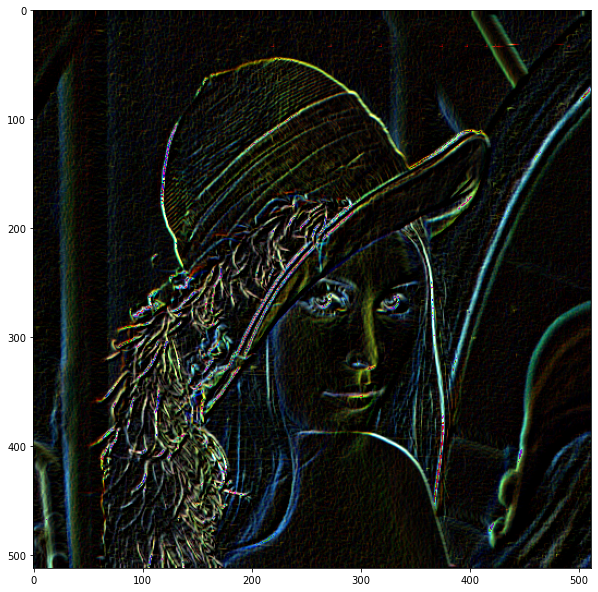

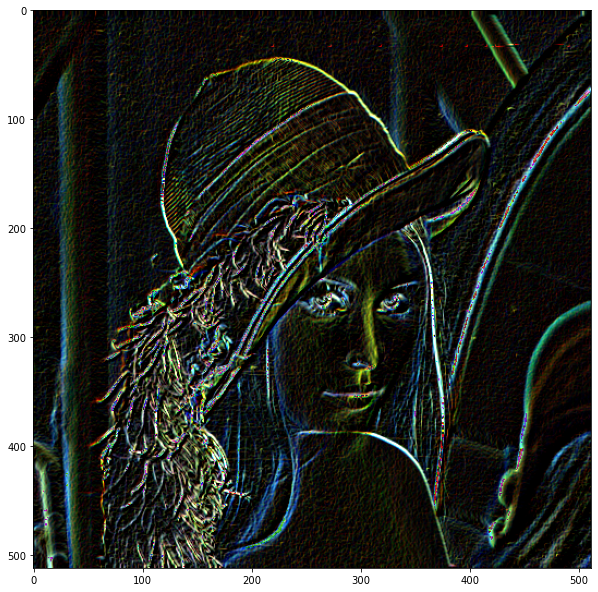

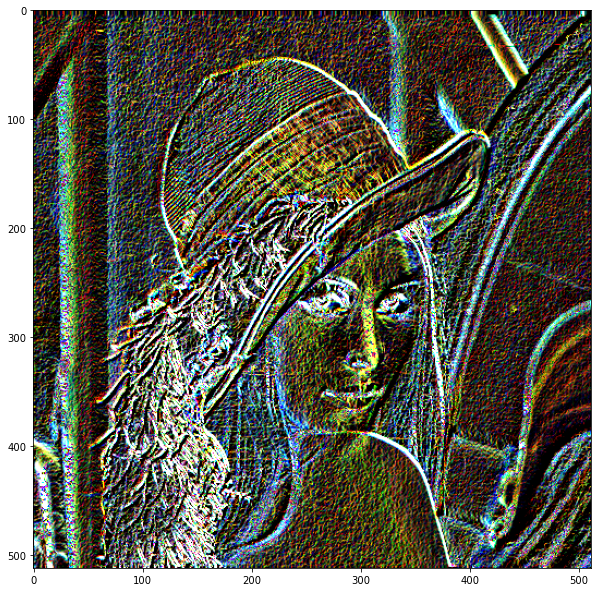

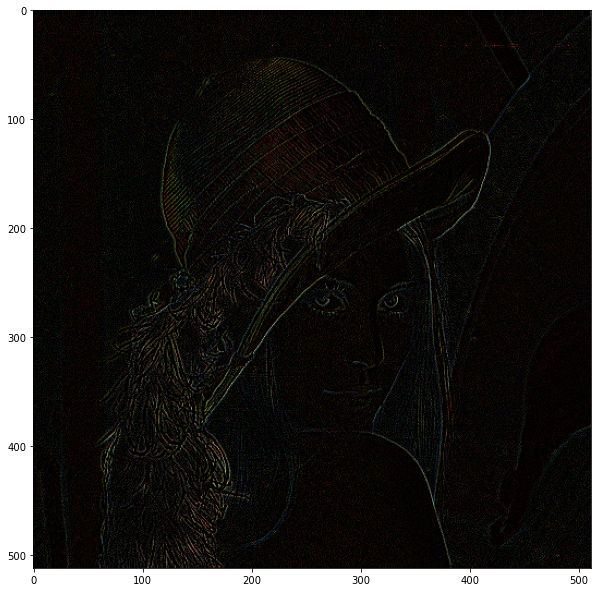

In [59]:
# 결과 출력
merged_1 = edge_x+edge_y
fig = plt.figure(figsize=(10,100))
out = fig.add_subplot(6,1,1)
out.imshow(merged_1)

merged_2 = edge_roberts_x+edge_roberts_y
fig = plt.figure(figsize=(10,100))
out = fig.add_subplot(6,1,2)
out.imshow(merged_2)

merged_3 = edge_Prewitt_x+edge_Prewitt_y
fig = plt.figure(figsize=(10,100))
out = fig.add_subplot(6,1,3)
out.imshow(merged_3)

merged_4 = edge_Sobel_x+edge_Sobel_y
fig = plt.figure(figsize=(10,100))
out = fig.add_subplot(6,1,4)
out.imshow(merged_4)

merged_5 = edge_Scharr_x+edge_Scharr_y
fig = plt.figure(figsize=(10,100))
out = fig.add_subplot(6,1,5)
out.imshow(merged_5)

fig = plt.figure(figsize=(10,100))
out = fig.add_subplot(6,1,6)
out.imshow(edge_Laplacian)